<a href="https://colab.research.google.com/github/nvancha/DS_Hackathon-/blob/main/M4Hackathon2023_DrugReviews_Reflection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#**Business Problem**
A large pharmaceutical company wants to develop a classification model to assess map customer reviews to ratings to understand how drug preference evolves over time. Specifically, the company wants to be able to predict if a drug will achieve a score 9 or above on customer ratings going forward.

#**Metrics**
AUC is the primary metric of classifier performance.

#**Libraries**

In [ ]:
# Install low-code AutoViz and PyCaret
!pip install -q psynlig
!pip install -q pycaret autoviz --upgrade psynlig
from pycaret.classification import *
from autoviz.AutoViz_Class import AutoViz_Class

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.8/2.8 MB 24.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 147.4/147.4 kB 2.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 121.2/121.2 kB 3.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.0/3.0 MB 21.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.0/3.0 MB 19.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.0/3.0 MB 10.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.0/3.0 MB 16.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.0/3.0 MB 35.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.0/3.0 MB 22.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.0/3.0 MB 30.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.2/3.2 MB 16.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 121.1/121.1 kB 6.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 

Imported v0.1.601. After importing, execute '%matplotlib inline' to display charts in Jupyter.
    AV = AutoViz_Class()
    dfte = AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=1, lowess=False,
               chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30, save_plot_dir=None)
Update: verbose=0 displays charts in your local Jupyter notebook.
        verbose=1 additionally provides EDA data cleaning suggestions. It also displays charts.
        verbose=2 does not display charts but saves them in AutoViz_Plots folder in local machine.
        chart_format='bokeh' displays charts in your local Jupyter notebook.
        chart_format='server' displays charts in your browser: one tab for each chart type
        chart_format='html' silently saves interactive HTML files in your local machine


In [ ]:
# Basic Libraries
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from numpy import mean
from numpy import absolute
from numpy import loadtxt
from datetime import datetime
import scipy.stats as ss
from scipy.stats.mstats import winsorize
import math
from matplotlib.colors import ListedColormap
from psynlig import pca_explained_variance_bar

In [ ]:
# sklearn
from sklearn.preprocessing import LabelEncoder
from sklearn import metrics
from sklearn import linear_model
from sklearn.linear_model import Lasso, Ridge, ElasticNet
from sklearn.model_selection import RepeatedKFold
from sklearn.model_selection import cross_val_score
from sklearn.cluster import KMeans
from sklearn.model_selection import KFold
from sklearn.pipeline import Pipeline
from sklearn.model_selection import RepeatedKFold
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import train_test_split, GridSearchCV, StratifiedKFold, cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import roc_auc_score, log_loss, balanced_accuracy_score, f1_score
from sklearn.model_selection import learning_curve


In [ ]:
# LightGBM & XGBoost Library
!pip install lightgbm
from lightgbm import LGBMClassifier
from xgboost import XGBClassifier

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
# Wordcloud & nltk
!pip install wordcloud
import nltk
from nltk import word_tokenize, sent_tokenize
from nltk.corpus import stopwords
from nltk.stem import LancasterStemmer, WordNetLemmatizer, PorterStemmer
from wordcloud import WordCloud, STOPWORDS
from textblob import TextBlob
from wordcloud import WordCloud, STOPWORDS

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
# imblearn library
from imblearn.over_sampling import SMOTE
from imblearn.pipeline import Pipeline as imbpipeline
from sklearn.pipeline import Pipeline


#**Data**

Original Data dictionary:
1. drugName (categorical): name of drug
2. condition (categorical): name of condition
3. review (text): patient review
4. rating (numerical): 10 star patient rating
5. date (date): date of review entry
6. usefulCount (numerical): number of users who found review useful

After preprocessing dataframe df has the following dictionary:
1. drugName (categorical): name of drug (label-encoded)
2. condition (categorical): name of condition (label-encoded)
3. review_length: number of characters in customer review
4. review_positivity: of review: sentiment/positivity score of review as scored by TextBlob
5. review_subjectivity: subjectivity score of review as scored by TextBlob  
6. binary_rating (numerical): rating (1 if original rating is 9 or greater, 0 otherwise) **TARGET VARIABLE**
7. time: integer value of date (converted integer value)
8. usefulCount: number of users who found review useful


In [ ]:
# Read
# File: https://drive.google.com/file/d/1WTxLu3AjnTvMgLGSwvKlhNSZHfMaO_GA/view?usp=share_linkk
url = 'https://drive.google.com/uc?id=1WTxLu3AjnTvMgLGSwvKlhNSZHfMaO_GA'

# Read in the dataset
df = pd.read_csv(url, header = 0)

In [ ]:
df=df.sample(n=10000)

#**M2 EDA**

In [ ]:
# Show dataframe
df

,uniqueID,drugName,condition,review,rating,date,usefulCount
9338,55771,Effexor,Depression,"""I was taken off Lexapro and put on this. It&#039;s made me extremely angry. I can&#039;t do my school work or anything. I want off this NOW.""",3,10-Dec-13,27
41647,227775,Etonogestrel,Birth Control,"""I have been on Implanon since November 4, 2011. As far as birth control, I had only tried the pill which I would forget to take by the 4th day. The Implanon is great in that you don&#039;t have to remember to take a pill everyday. I have experienced some mild side effects which I can deal with (so long as they remain mild). I have gained about 5 pounds had one heavy period and feel constantly bloated. I also have cravings all the time. I started spotting very lightly last week but it has not turned into a full on period. After reading the other reviews I have noticed that the people who bleed more are the ones who don&#039;t gain weight. My complexion wasn&#039;t bad before and has actually gotten a little better.""",7,3-Jan-12,0
104726,198213,Ranolazine,Angina,"""Weight loss. Glucose reduction , off insulin. Taking orals only.""",10,7-Aug-15,22
33362,97980,Nexplanon,Birth Control,"""I was terrified to try this drug after reading a lot of the reviews, but then I remembered that people who&#039;ve had a bad experience are FAR more likely to post a review. I reluctantly went in and had the device inserted in my arm, I&#039;m a BIG WUSS so I was super scared! It wasn&#039;t nearly as bad as I had imagined, all you really feel is the first needle used to numb the area (kind of like when they draw blood, just a sting) and then after that, it&#039;s nothing. The area did bruise pretty badly for about a week and a half (which I was told to expect) and was only slightly painful and awkward. I got the implant while I was on my period my period literally stopped a few hours later and I&#039;ve not had one since! BEST BIRTHCONTROL EVER!!!! JUST DO IT!""",10,11-Sep-15,7
117570,81305,Yaz,Menstrual Disorders,"""I have been on Yaz for about 4 months now. I started taking it to regulate my periods, as they were very heavy and irregular. Yaz helped 100% with that issue. Now I know when my period will arrive and it only lasts about 4 days. Yaz has also cleared up my acne. Before taking it I had fairly severe acne (for a 36 year old) and since taking Yaz I don&#039;t have severe breakouts, just one or two pimples here and there. If I had to list my negative experiences since taking Yaz it would be my irritability. Small things annoy me...like my husband chewing his cereal. It&#039;s not bad enough that I go into a rage or anything, but it can be annoying. Also, the outside edges of my breasts are sore. Feels like when I was nursing! So far, a positive experience""",8,17-Aug-15,8
...,...,...,...,...,...,...,...
105827,6421,Ocella,0</span> users found this comment helpful.,"""I was on Ortho Tri-Cyclen low for two years before switching to Ocella. I used to throw up and break out constantly so I switched to Ocella. So far, I love it. I haven&#039;t had nausea, spotting, headaches, mood swings, or heavy periods! Unfortunately, I definitely have gained weight but nothing unmanageable. I had moderately severe acne and it has been clearing up slowly but surely, which is a huge deal for me since I&#039;m a senior in high school. My sex drive has gone way down.""",9,29-Nov-11,0
92813,37862,Reclipsen,Birth Control,"""I have been on Reclipsen for about a year now. I have definitely noticed a decrease in sex drive which has caused some issues. Some emotional ups and downs but I guess that is to be expected. I&#039;m not sure if it is related to the birth control but I have noticed some weight gain which has been hard to control but I have had no breakthrough bleeding and altogether I have been pretty pleased. I can honestly say it has worked well as a birth control for me seeing as I haven&#039;t gotten pregnant and I have been on the pill for over a year now.""",9,30

In [ ]:
# Shape
df.shape

(10000, 7)

In [ ]:
# Checking missing values
print('Number of missing Values by Feature\n',df.isnull().sum())
columns_with_NaNs = []
for col in df.columns:
  if df[col].isnull().sum() > 0:
    columns_with_NaNs.append(col)
print('Columns with NaNs:',columns_with_NaNs)

Number of missing Values by Feature
 uniqueID        0
drugName        0
condition      56
review          0
rating          0
date            0
usefulCount     0
dtype: int64
Columns with NaNs: ['condition']


In [ ]:
#checking dups
duplicates_count = df.duplicated().sum()
print('No. of dups:',duplicates_count)

No. of dups: 0


In [ ]:
# Number of unique values in each feature
df.nunique()

uniqueID       10000
drugName        1496
condition        484
review          9827
rating            10
date            3032
usefulCount      234
dtype: int64

In [ ]:
# Dataframe info
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10000 entries, 9338 to 136781
Data columns (total 7 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   uniqueID     10000 non-null  int64 
 1   drugName     10000 non-null  object
 2   condition    9944 non-null   object
 3   review       10000 non-null  object
 4   rating       10000 non-null  int64 
 5   date         10000 non-null  object
 6   usefulCount  10000 non-null  int64 
dtypes: int64(3), object(4)
memory usage: 625.0+ KB


    Since nrows is smaller than dataset, loading random sample of 2000 rows into pandas...
Shape of your Data Set loaded: (2000, 7)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
Data cleaning improvement suggestions. Complete them before proceeding to ML modeling.


,Nullpercent,NuniquePercent,dtype,Nuniques,Nulls,Least num. of categories,Data cleaning improvement suggestions
condition,0.550000,13.700000,object,274,11,1,"combine rare categories, fill missing values, fix mixed data types"
uniqueID,0.000000,100.000000,int64,2000,0,0,possible ID column: drop
drugName,0.000000,35.950000,object,719,0,1,combine rare categories
review,0.000000,99.650000,object,1993,0,1,combine rare categories
rating,0.000000,0.500000,int64,10,0,0,
date,0.000000,72.000000,object,1440,0,1,combine rare categories
usefulCount,0.000000,8.100000,int64,162,0,0,


    7 Predictors classified...
        1 variables removed since they were ID or low-information variables
        List of variables removed: ['uniqueID']
Since Number of Rows in data 2000 exceeds maximum, randomly sampling 2000 rows for EDA...
Number of All Scatter Plots = 3


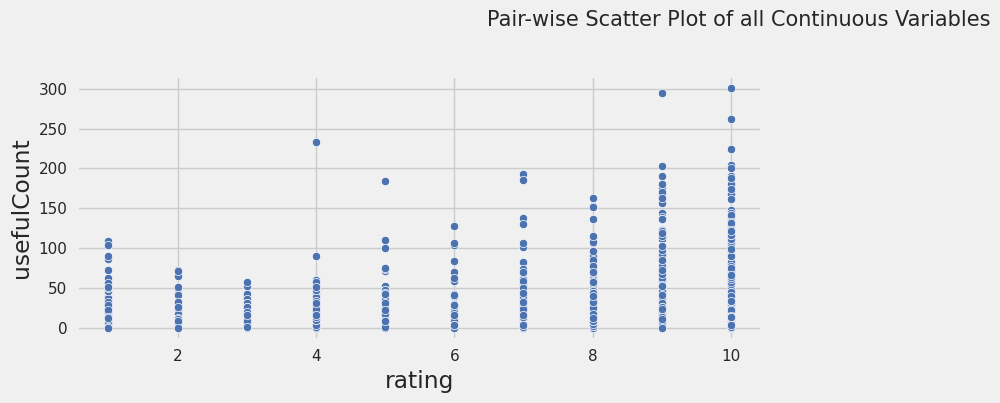

Could not draw Distribution Plot


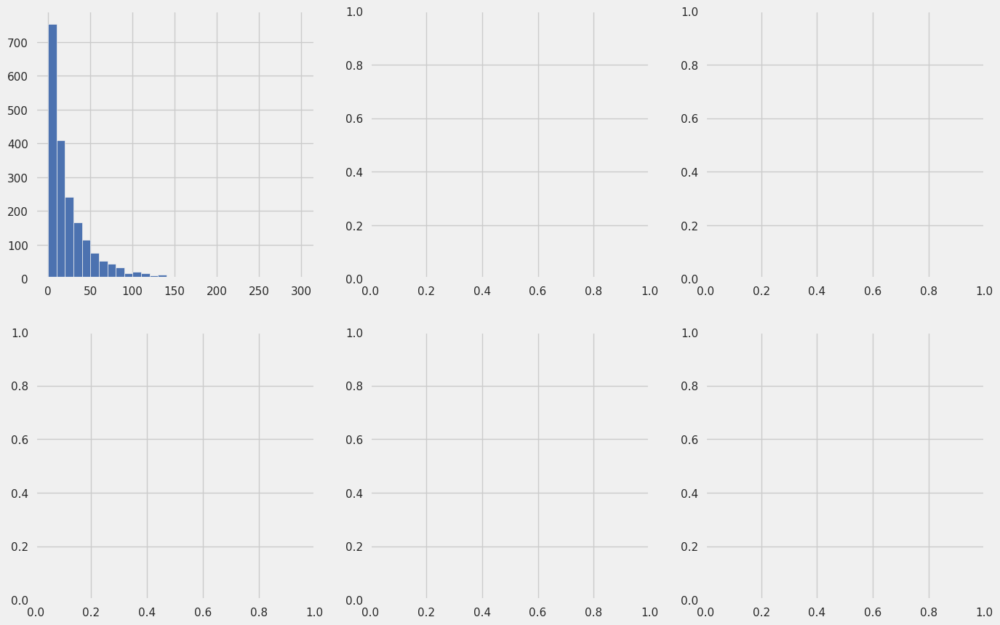

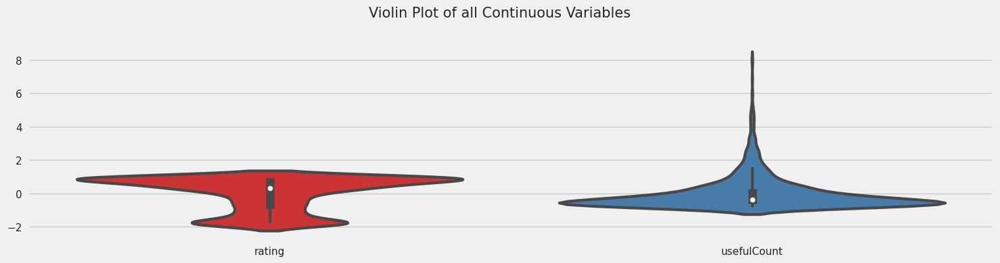

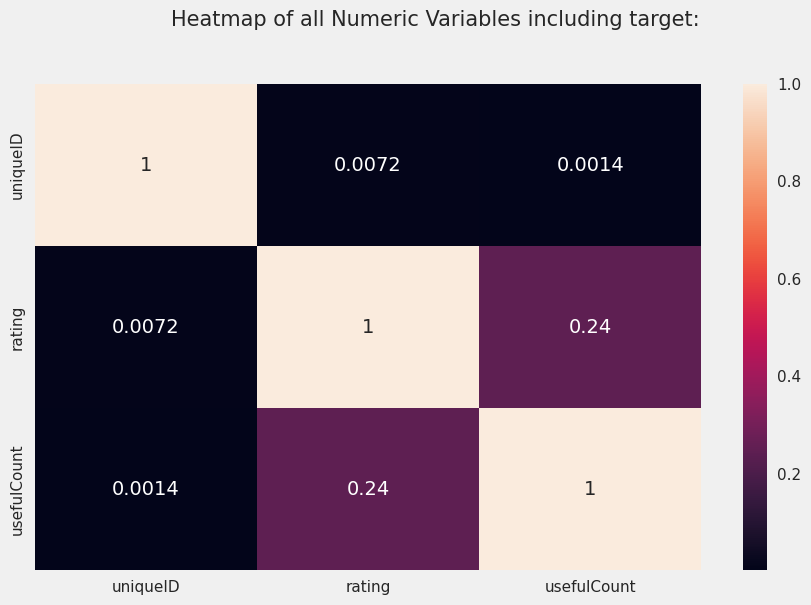

[nltk_data] Downloading collection 'popular'
[nltk_data]    | 
[nltk_data]    | Downloading package cmudict to /root/nltk_data...
[nltk_data]    |   Package cmudict is already up-to-date!
[nltk_data]    | Downloading package gazetteers to /root/nltk_data...
[nltk_data]    |   Package gazetteers is already up-to-date!
[nltk_data]    | Downloading package genesis to /root/nltk_data...
[nltk_data]    |   Package genesis is already up-to-date!
[nltk_data]    | Downloading package gutenberg to /root/nltk_data...
[nltk_data]    |   Package gutenberg is already up-to-date!
[nltk_data]    | Downloading package inaugural to /root/nltk_data...
[nltk_data]    |   Package inaugural is already up-to-date!
[nltk_data]    | Downloading package movie_reviews to
[nltk_data]    |     /root/nltk_data...
[nltk_data]    |   Package movie_reviews is already up-to-date!
[nltk_data]    | Downloading package names to /root/nltk_data...
[nltk_data]    |   Package names is already up-to-date!
[nltk_data]    | Do

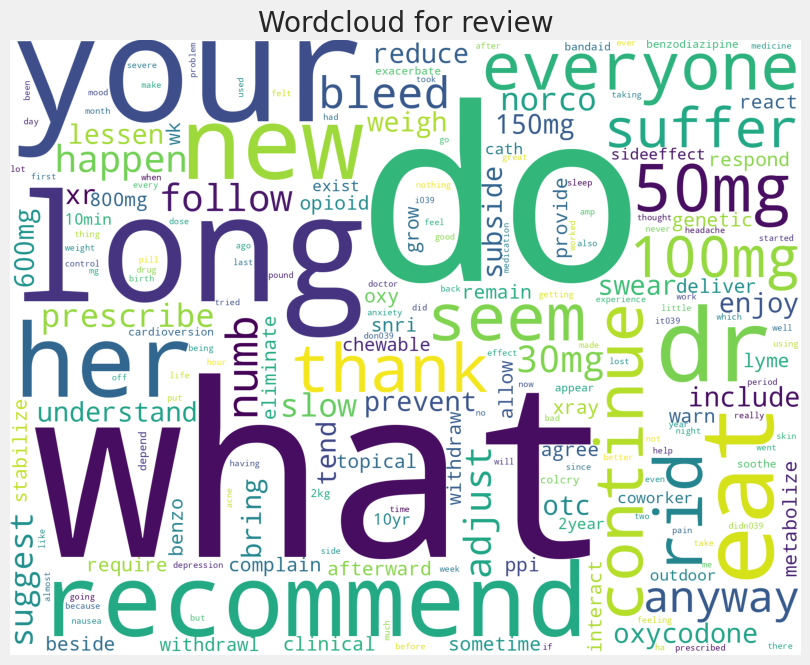

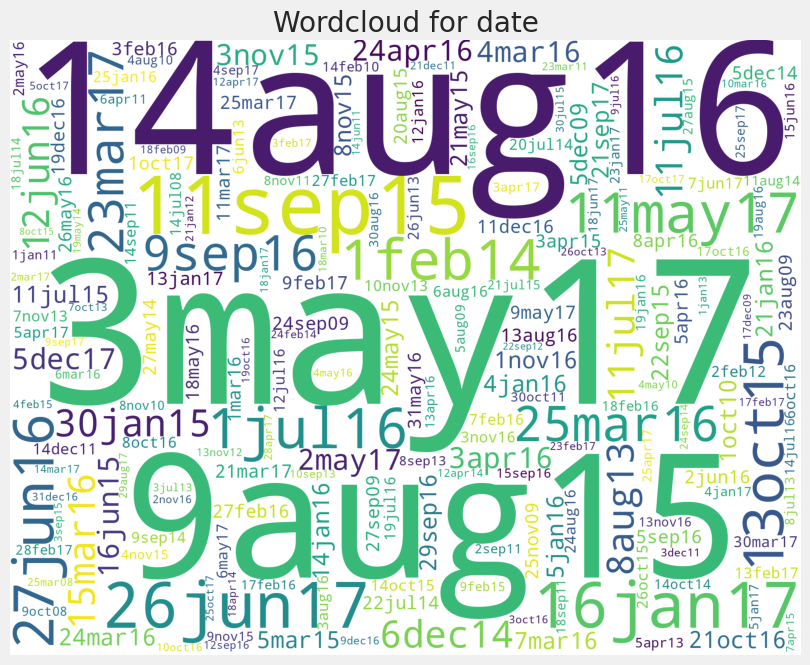

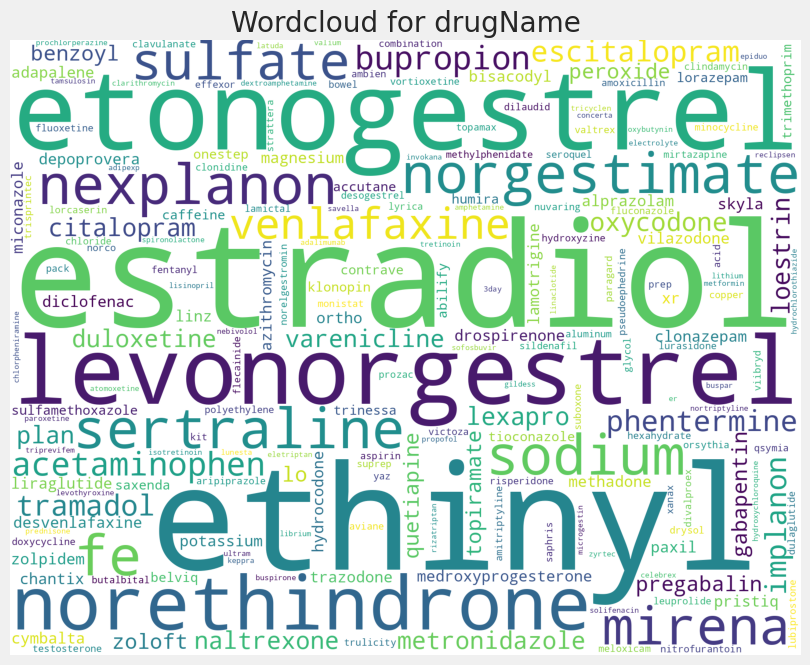

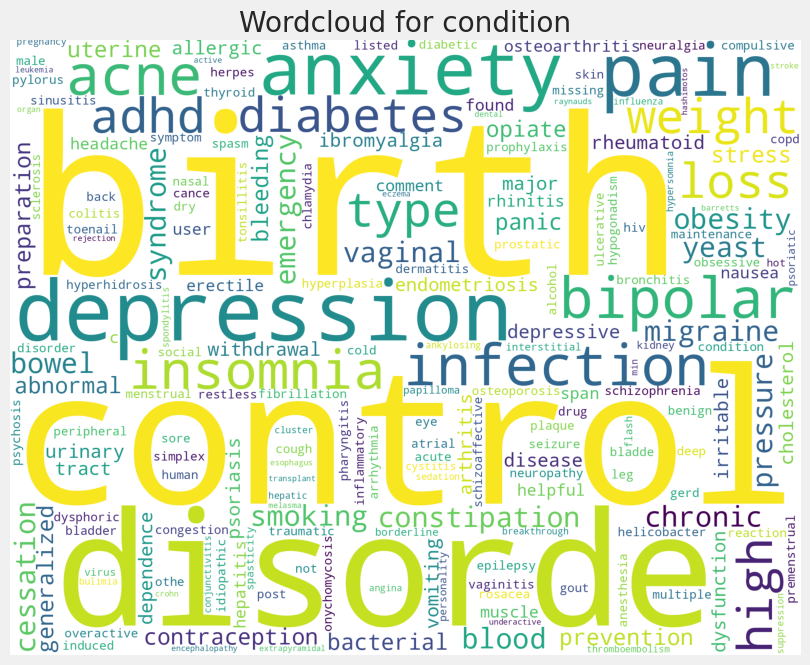

All Plots done
Time to run AutoViz = 42 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


In [ ]:
# Get some graphs!
# create an AutoViz class
AV = AutoViz_Class()
# create charts
%matplotlib inline
dftc = AV.AutoViz(filename='', sep ='', dfte = df, header = 0,
verbose = 1, lowess = False, chart_format ='png', max_rows_analyzed = 2000, max_cols_analyzed = 30)

In [ ]:
# Skewness of usefulCount
df['usefulCount'].skew()

3.176550949767851

#**M3 Preprocessing**

#*Dropped Features*

In [ ]:
# Drop uniqueID
df=df.drop('uniqueID',axis=1)

##*Missing Values*

In [ ]:
# Remove instances with NaN values
df = df.dropna()

In [ ]:
# Checking missing values
print('Number of missing Values by Feature\n',df.isnull().sum())
columns_with_NaNs = []
for col in df.columns:
  if df[col].isnull().sum() > 0:
    columns_with_NaNs.append(col)
print('Columns with NaNs:',columns_with_NaNs)

Number of missing Values by Feature
 drugName       0
condition      0
review         0
rating         0
date           0
usefulCount    0
dtype: int64
Columns with NaNs: []


##*Encodings*

In [ ]:
# Covert rating to a binary target

# Threshold value
threshold = 8

# Convert values above threshold in the column to 1 and below threshold to 0
df['rating'] = df['rating'].apply(lambda x: 1 if x > threshold else 0)


In [ ]:
# Label encode drugName and condition
# create a LabelEncoder object
le = LabelEncoder()

# apply label encoding to each column
for col in ['drugName','condition']:
    if df[col].dtype == 'object':
        df[col] = le.fit_transform(df[col])


##*Date*

In [ ]:
# # Convert date to an integer
# # Define a function to convert the string date to an integer
# def date_to_int(date_str):
#     date_obj = datetime.strptime(date_str, '%d-%b-%y')
#     year = date_obj.year
#     month = date_obj.month
#     day = date_obj.day
#     return int(f"{year:04d}{month:02d}{day:02d}")

# # Apply the function to the date column and create a new integer column
# df['date'] = df['date'].apply(date_to_int)

In [ ]:
# Extract year, month and day from date feature
df['Weekday'] = pd.DatetimeIndex(df['date']).weekday
df['Month'] = pd.DatetimeIndex(df['date']).month

def ymd_to_timestamp(value):
    if isinstance(value, str):
        x = datetime.strptime(value, "%d-%b-%y").timestamp() /  1000000
    else:
        x = value
    return x

# apply the function to the date column using the 'apply' method
df['date'] = df['date'].apply(lambda x: ymd_to_timestamp(x))
df.head()

,drugName,condition,review,rating,date,usefulCount,Weekday,Month
9338,457,148,"""I was taken off Lexapro and put on this. It&#039;s made me extremely angry. I can&#039;t do my school work or anything. I want off this NOW.""",0,1386.6336,27,1,12
41647,512,83,"""I have been on Implanon since November 4, 2011. As far as birth control, I had only tried the pill which I would forget to take by the 4th day. The Implanon is great in that you don&#039;t have to remember to take a pill everyday. I have experienced some mild side effects which I can deal with (so long as they remain mild). I have gained about 5 pounds had one heavy period and feel constantly bloated. I also have cravings all the time. I started spotting very lightly last week but it has not turned into a full on period. After reading the other reviews I have noticed that the people who bleed more are the ones who don&#039;t gain weight. My complexion wasn&#039;t bad before and has actually gotten a little better.""",0,1325.5488,0,1,1
104726,1135,49,"""Weight loss. Glucose reduction , off insulin. Taking orals only.""",1,1438.9056,22,4,8
33362,931,83,"""I was terrified to try this drug after reading a lot of the reviews, but then I remembered that people who&#039;ve had a bad experience are FAR more likely to post a review. I reluctantly went in and had the device inserted in my arm, I&#039;m a BIG WUSS so I was super scared! It wasn&#039;t nearly as bad as I had imagined, all you really feel is the first needle used to numb the area (kind of like when they draw blood, just a sting) and then after that, it&#039;s nothing. The area did bruise pretty badly for about a week and a half (which I was told to expect) and was only slightly painful and awkward. I got the implant while I was on my period my period literally stopped a few hours later and I&#039;ve not had one since! BEST BIRTHCONTROL EVER!!!! JUST DO IT!""",1,1441.9296,7,4,9
117570,1452,278,"""I have been on Yaz for about 4 months now. I started taking it to regulate my periods, as they were very heavy and irregular. Yaz helped 100% with that issue. Now I know when my period will arrive and it only lasts about 4 days. Yaz has also cleared up my acne. Before taking it I had fairly severe acne (for a 36 year old) and since taking Yaz I don&#039;t have severe breakouts, just one or two pimples here and there. If I had to list my negative experiences since taking Yaz it would be my irritability. Small things annoy me...like my husband chewing his cereal. It&#039;s not bad enough that I go into a rage or anything, but it can be annoying. Also, the outside edges of my breasts are sore. Feels like when I was nursing! So far, a positive experience""",0,1439.7696,8,0,8


In [ ]:
# Check
df

,drugName,condition,review,rating,date,usefulCount,Weekday,Month
9338,457,148,"""I was taken off Lexapro and put on this. It&#039;s made me extremely angry. I can&#039;t do my school work or anything. I want off this NOW.""",0,1386.6336,27,1,12
41647,512,83,"""I have been on Implanon since November 4, 2011. As far as birth control, I had only tried the pill which I would forget to take by the 4th day. The Implanon is great in that you don&#039;t have to remember to take a pill everyday. I have experienced some mild side effects which I can deal with (so long as they remain mild). I have gained about 5 pounds had one heavy period and feel constantly bloated. I also have cravings all the time. I started spotting very lightly last week but it has not turned into a full on period. After reading the other reviews I have noticed that the people who bleed more are the ones who don&#039;t gain weight. My complexion wasn&#039;t bad before and has actually gotten a little better.""",0,1325.5488,0,1,1
104726,1135,49,"""Weight loss. Glucose reduction , off insulin. Taking orals only.""",1,1438.9056,22,4,8
33362,931,83,"""I was terrified to try this drug after reading a lot of the reviews, but then I remembered that people who&#039;ve had a bad experience are FAR more likely to post a review. I reluctantly went in and had the device inserted in my arm, I&#039;m a BIG WUSS so I was super scared! It wasn&#039;t nearly as bad as I had imagined, all you really feel is the first needle used to numb the area (kind of like when they draw blood, just a sting) and then after that, it&#039;s nothing. The area did bruise pretty badly for about a week and a half (which I was told to expect) and was only slightly painful and awkward. I got the implant while I was on my period my period literally stopped a few hours later and I&#039;ve not had one since! BEST BIRTHCONTROL EVER!!!! JUST DO IT!""",1,1441.9296,7,4,9
117570,1452,278,"""I have been on Yaz for about 4 months now. I started taking it to regulate my periods, as they were very heavy and irregular. Yaz helped 100% with that issue. Now I know when my period will arrive and it only lasts about 4 days. Yaz has also cleared up my acne. Before taking it I had fairly severe acne (for a 36 year old) and since taking Yaz I don&#039;t have severe breakouts, just one or two pimples here and there. If I had to list my negative experiences since taking Yaz it would be my irritability. Small things annoy me...like my husband chewing his cereal. It&#039;s not bad enough that I go into a rage or anything, but it can be annoying. Also, the outside edges of my breasts are sore. Feels like when I was nursing! So far, a positive experience""",0,1439.7696,8,0,8
...,...,...,...,...,...,...,...,...
105827,965,0,"""I was on Ortho Tri-Cyclen low for two years before switching to Ocella. I used to throw up and break out constantly so I switched to Ocella. So far, I love it. I haven&#039;t had nausea, spotting, headaches, mood swings, or heavy periods! Unfortunately, I definitely have gained weight but nothing unmanageable. I had moderately severe acne and it has been clearing up slowly but surely, which is a huge deal for me since I&#039;m a senior in high school. My sex drive has gone way down.""",1,1322.5248,0,1,11
92813,1139,83,"""I have been on Reclipsen for about a year now. I have definitely noticed a decrease in sex drive which has caused some issues. Some emotional ups and downs but I guess that is to be expected. I&#039;m not sure if it is related to the birth control but I have noticed some weight gain which has been hard to control but I have had no breakthrough bleeding and altogether I have been pretty pleased. I can honestly say it has worked well as a birth control for me seeing as I haven&#039;t gotten pregnant and I have been on the pill for over a year now.""",1,1322.6112,4,2,11
152212,1470,295,"""I lost 5 pounds in 2 days while pregnant because I could not hold down any solids. A doctor injected Zofran

##*Text Preprocessing*

We will use some code to pre-process the review text

In [ ]:
# Figure length of review title and body
df['review_length'] = df['review'].str.len()


In [ ]:
## Change the review to string
df['review'] = df['review'].astype(str)

## Lowercase all reviews
df['review'] = df['review'].apply(lambda x: " ".join(x.lower() for x in x.split()))

In [ ]:
## remove punctuation
df['review'] = df['review'].str.replace('.','')
df['review'] = df['review'].str.replace(',','')
df['review'] = df['review'].str.replace('!','')
df['review'] = df['review'].str.replace('?','')


In [ ]:
# remove stopwords
import requests
stopwords_list = requests.get("https://gist.githubusercontent.com/rg089/35e00abf8941d72d419224cfd5b5925d/raw/12d899b70156fd0041fa9778d657330b024b959c/stopwords.txt").content
stop = set(stopwords_list.decode().splitlines())
#stop = stopwords.words('english')
df['review'] = df['review'].apply(lambda x: " ".join(x for x in x.split() if x not in stop))

In [ ]:
# Stemming
st = PorterStemmer()
df['review'] = df['review'].apply(lambda x: " ".join([st.stem(word) for word in x.split()]))

In [ ]:
## Define a function which can be applied to calculate the score for the whole dataset
def senti(x):
    return TextBlob(x).sentiment.polarity
def subj(x):
    return TextBlob(x).sentiment.subjectivity
df['review_positivity'] = df['review'].apply(senti)
df['review_subjectivity'] = df['review'].apply(subj)

In [ ]:
# Drop the original 'review' columns
df=df.drop(columns=['review'],axis=1)

In [ ]:
# Check df
df

,drugName,condition,rating,date,usefulCount,Weekday,Month,review_length,review_positivity,review_subjectivity
9338,457,148,0,1386.6336,27,1,12,142,0.000000,0.000000
41647,512,83,0,1325.5488,0,1,1,732,0.145238,0.559524
104726,1135,49,1,1438.9056,22,4,8,68,0.000000,1.000000
33362,931,83,1,1441.9296,7,4,9,776,-0.229167,0.645833
117570,1452,278,0,1439.7696,8,0,8,762,-0.150000,0.343333
...,...,...,...,...,...,...,...,...,...,...
105827,965,0,1,1322.5248,0,1,11,494,0.214921,0.557302
92813,1139,83,1,1322.6112,4,2,11,553,-0.037963,0.443519
152212,1470,295,1,1243.2960,7,1,5,267,0.111111,0.222222
160700,1265,198,1,1323.4752,76,5,12,760,0.181077,0.412357


##*Skewness*

In [ ]:
# Feature Types
quant_features = ['drugName', 'condition', 'rating', 'date', 'usefulCount', 'Weekday',
       'Month', 'review_length', 'review_positivity', 'review_subjectivity']


In [ ]:
# pick numerical variables and set them as X
for feature in quant_features:
  df[feature]=pd.to_numeric(df[feature], errors='coerce')
X = df[quant_features]

In [ ]:
from scipy.stats import skew
skewness = X.apply(lambda x: skew(x))
cols_to_transform = skewness[skewness > 1].index
X[cols_to_transform] = np.log1p(X[cols_to_transform])

##*Outliers*

In [ ]:
X

,drugName,condition,rating,date,usefulCount,Weekday,Month,review_length,review_positivity,review_subjectivity
9338,457,148,0,1386.6336,3.332205,1,12,142,0.000000,0.000000
41647,512,83,0,1325.5488,0.693147,1,1,732,0.145238,0.559524
104726,1135,49,1,1438.9056,3.135494,4,8,79,0.000000,0.846667
33362,931,83,1,1441.9296,2.079442,4,9,770,-0.229167,0.645833
117570,1452,278,0,1439.7696,2.197225,0,8,762,-0.150000,0.343333
...,...,...,...,...,...,...,...,...,...,...
105827,965,0,1,1322.5248,0.693147,1,11,494,0.214921,0.557302
92813,1139,83,1,1322.6112,1.609438,2,11,553,-0.037963,0.443519
152212,1470,295,1,1243.2960,2.079442,1,5,267,0.111111,0.222222
160700,1265,198,1,1323.4752,4.343805,5,12,760,0.181077,0.412357


In [ ]:
# Tukey Rule outliers
# As an alternative, you could use z-scores greater than 3 or less than -3.

#Tukey's method
def tukey_rule(data, col):
    Q1 = data[col].quantile(0.25)
    Q3 = data[col].quantile(0.75)
    IQR = Q3 - Q1
    upper_lim = data[col].quantile(0.5) + 2 * IQR
    lower_lim = data[col].quantile(0.5) - 2 * IQR
    outliers = []
    for index, x in enumerate(data[col]):
        if x < lower_lim or x >= upper_lim:
            outliers.append(index)
    return outliers

# Identify outliers
for i in quant_features:
  outliers_Tukey = tukey_rule(X,i)

# Winsorize X and check the results
X_winsorized = X.copy(deep=True)
for i in quant_features:
  X_winsorized[i] = winsorize(X[i], limits=(0.05, 0.05))

In [ ]:
# Update result df with winzorized quant features

def winzorized(self):
  for ls in self:
    df[ls]=X_winsorized[ls]

winzorized(quant_features)

##*AutoViz Again*

    Since nrows is smaller than dataset, loading random sample of 2000 rows into pandas...
Shape of your Data Set loaded: (2000, 10)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
Data cleaning improvement suggestions. Complete them before proceeding to ML modeling.


,Nullpercent,NuniquePercent,dtype,Nuniques,Nulls,Least num. of categories,Data cleaning improvement suggestions
drugName,0.000000,32.550000,int64,651,0,0,
condition,0.000000,12.650000,int64,253,0,0,
date,0.000000,62.750000,float64,1255,0,0,
usefulCount,0.000000,4.650000,float64,93,0,0,
Weekday,0.000000,0.350000,int64,7,0,0,
Month,0.000000,0.600000,int64,12,0,0,
review_length,0.000000,30.500000,int64,610,0,0,
review_positivity,0.000000,41.150000,float64,823,0,0,
review_subjectivity,0.000000,34.150000,float64,683,0,0,


    9 Predictors classified...
        No variables removed since no ID or low-information variables found in data set
Since Number of Rows in data 2000 exceeds maximum, randomly sampling 2000 rows for EDA...

################ Binary_Classification problem #####################


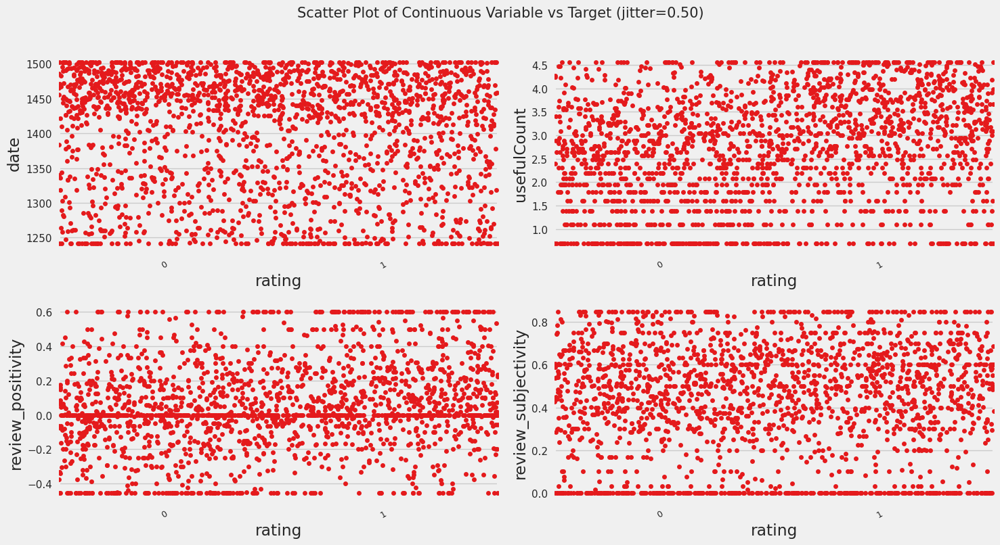

Total Number of Scatter Plots = 10


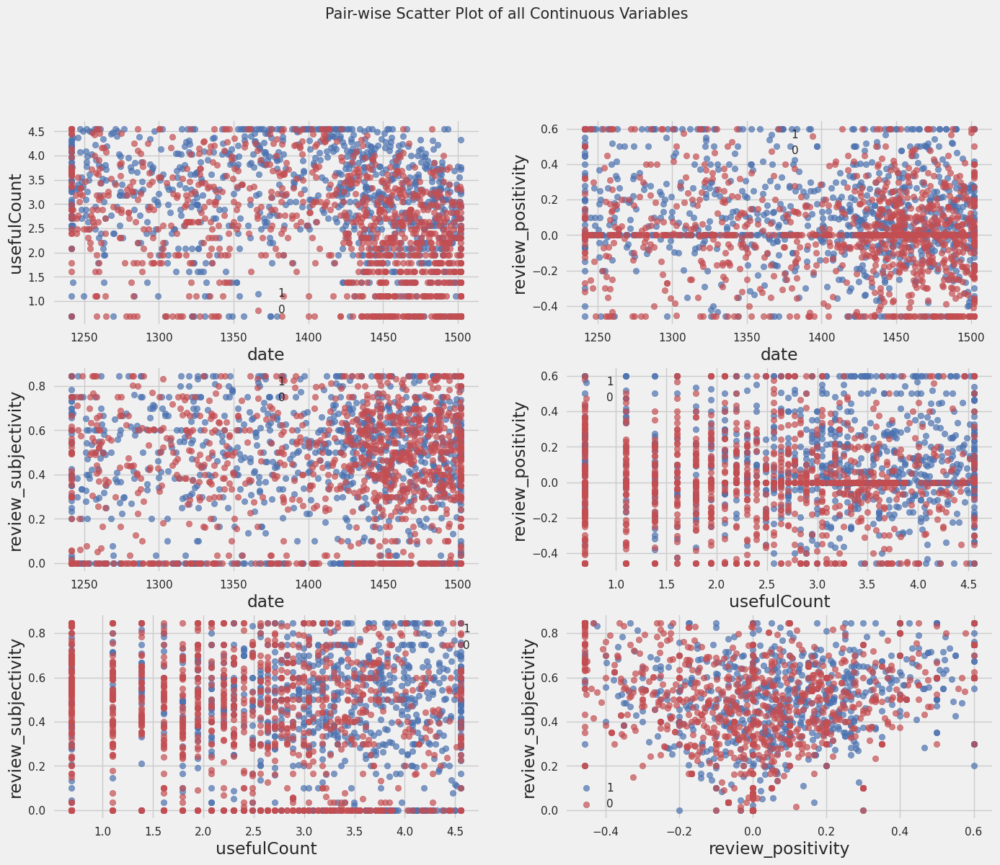

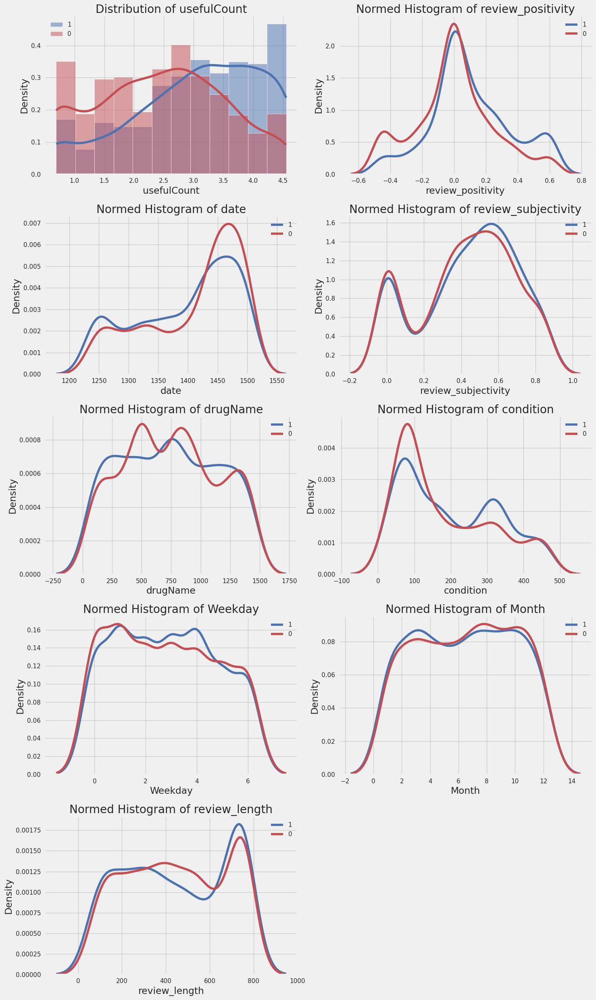

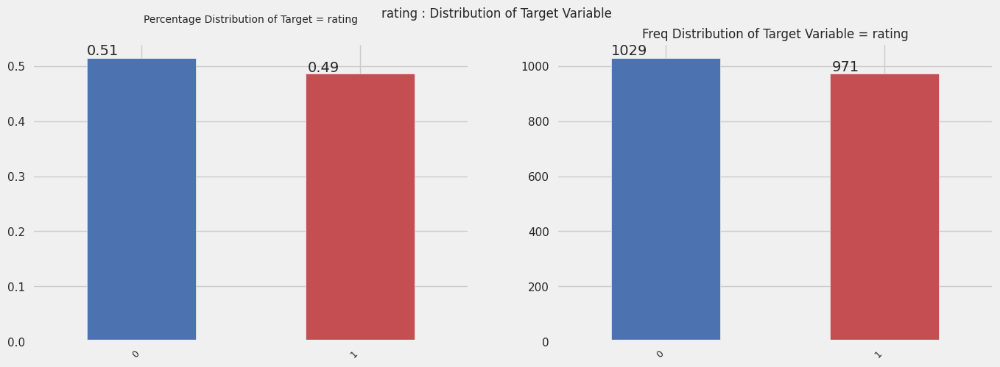

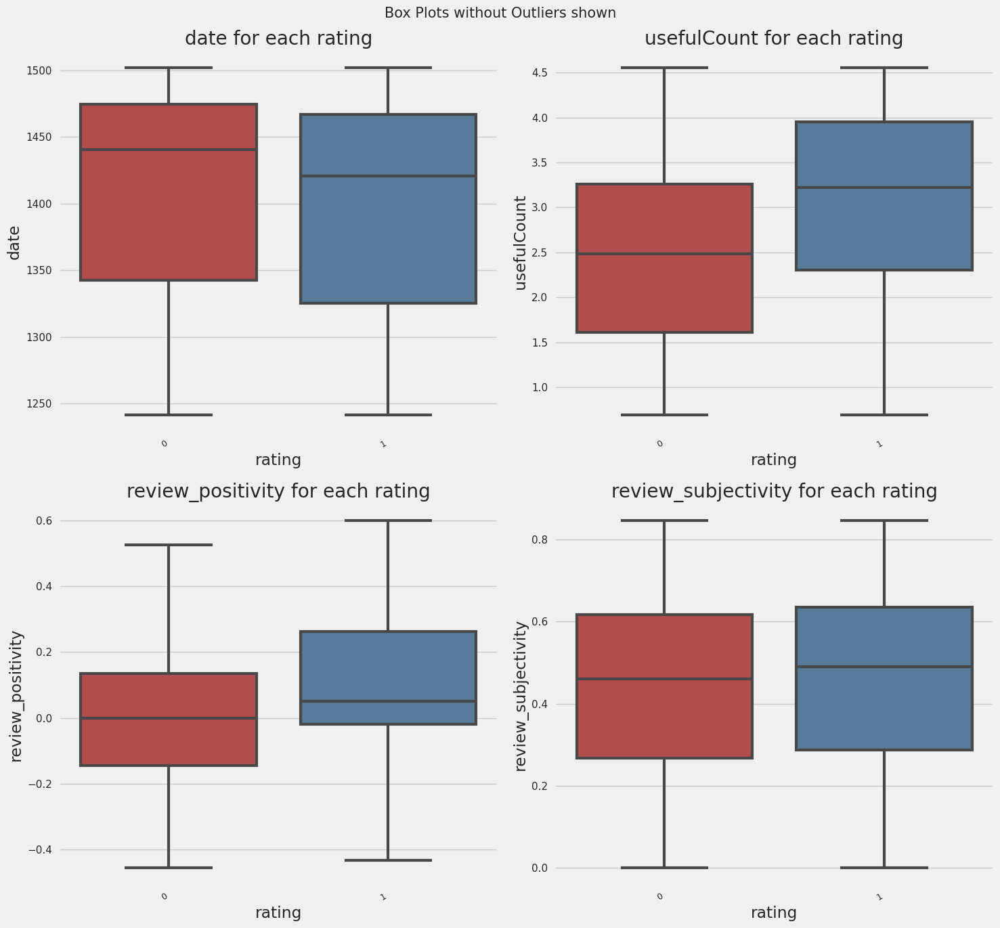

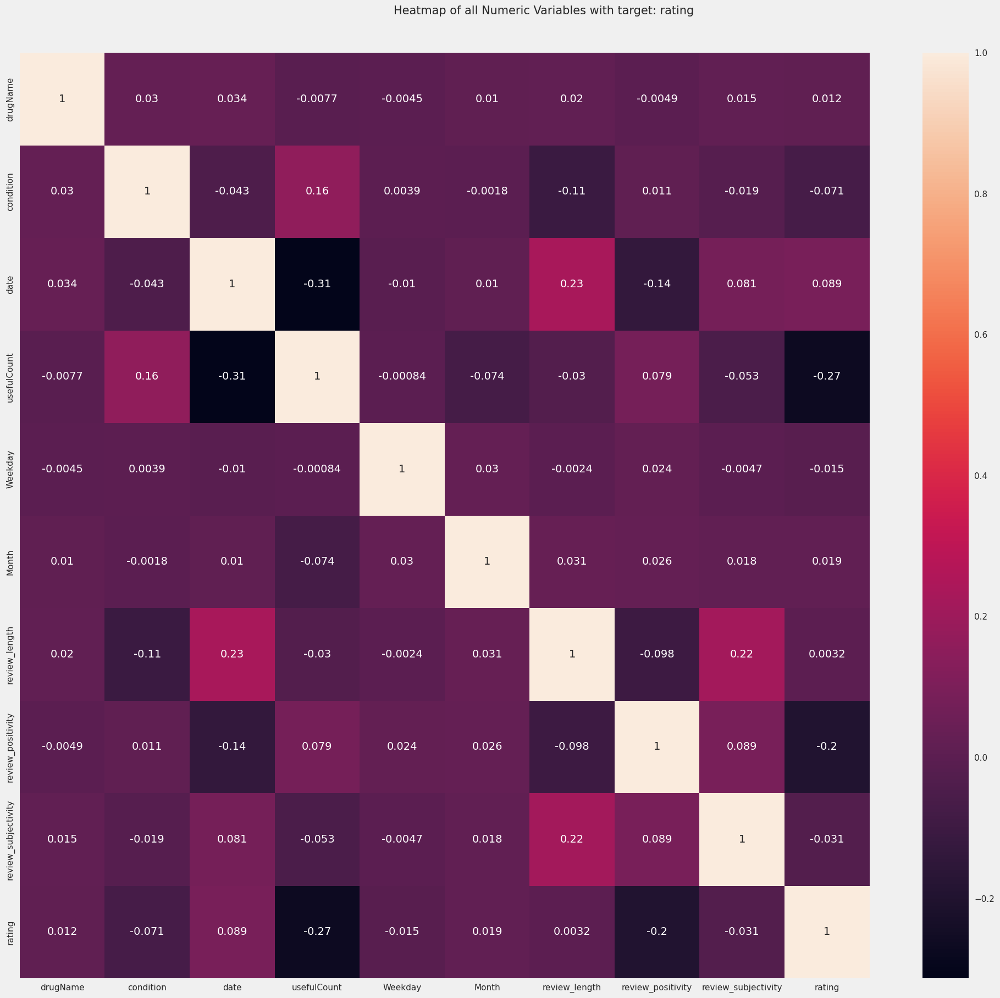

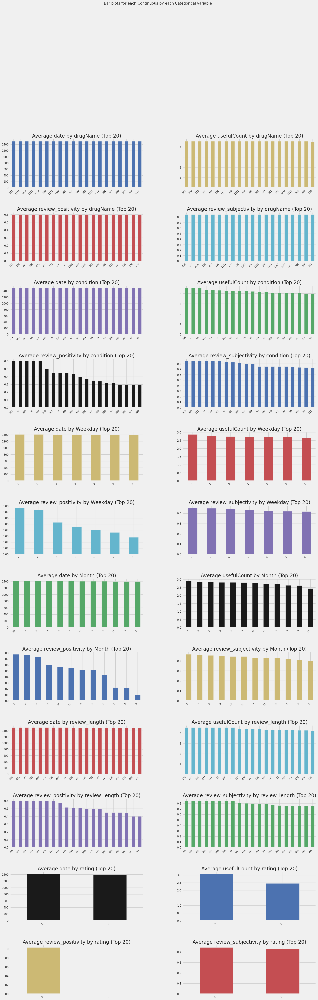

All Plots done
Time to run AutoViz = 32 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


In [ ]:
# Let's review the graphs!
# create an AutoViz class
AV = AutoViz_Class()
# create charts
%matplotlib inline
dftc = AV.AutoViz(filename='', sep ='' , depVar = 'rating', dfte = df, header = 0,
verbose = 1, lowess = False, chart_format ='png', max_rows_analyzed = 2000, max_cols_analyzed = 30)

##*Split Predictors and Target*

In [ ]:
# Split df into target y and predictors X
X = df.drop('rating',axis=1)
col_names = X.columns
y = df['rating']
y=pd.DataFrame(y)
y.columns=['rating']


In [ ]:
X=X[['drugName', 'date', 'usefulCount', 'review_length', 'review_positivity']]
col_names = X.columns


#*Principal Components Analysis*



Checking: mean of column 0 of X_pca: 3.1797216151774395e-17  and its std deviation: 1.0000502853695035


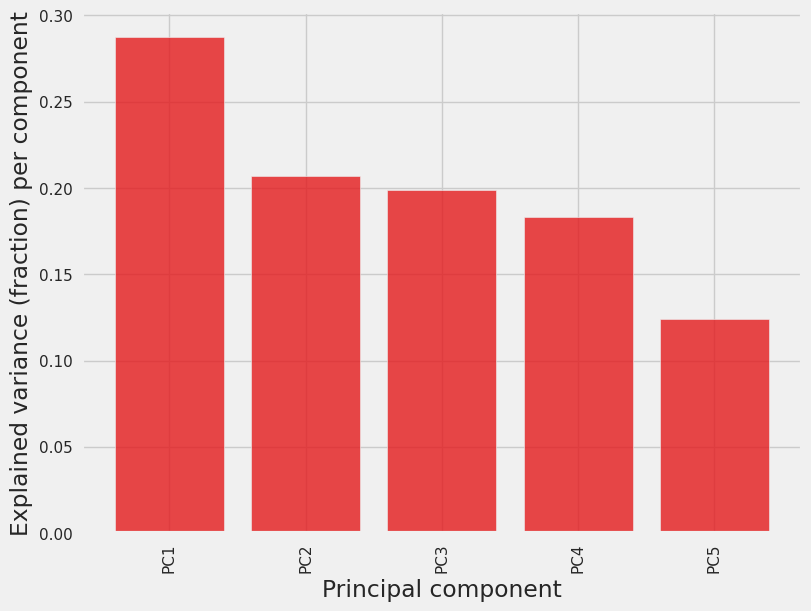

In [ ]:
#Create a PCA object with the desired number of components
pca = PCA(n_components=5)

# Scale predictors
stdsc = StandardScaler()
X_pca = pd.DataFrame(stdsc.fit_transform(X))
print("Checking: mean of column 0 of X_pca:",X_pca[0].mean(), " and its std deviation:", X_pca[0].std())

# Examine the explained variance ratio in order for each components
pca = PCA()
X_pca = pca.fit_transform(X_pca)
pca.explained_variance_ratio_

pca_explained_variance_bar(pca, alpha=0.8)
plt.show()

#*Original Preprocessed Feature Importance*
We'll use the entire dataset df to generate feature importance numbers.

<BarContainer object of 5 artists>

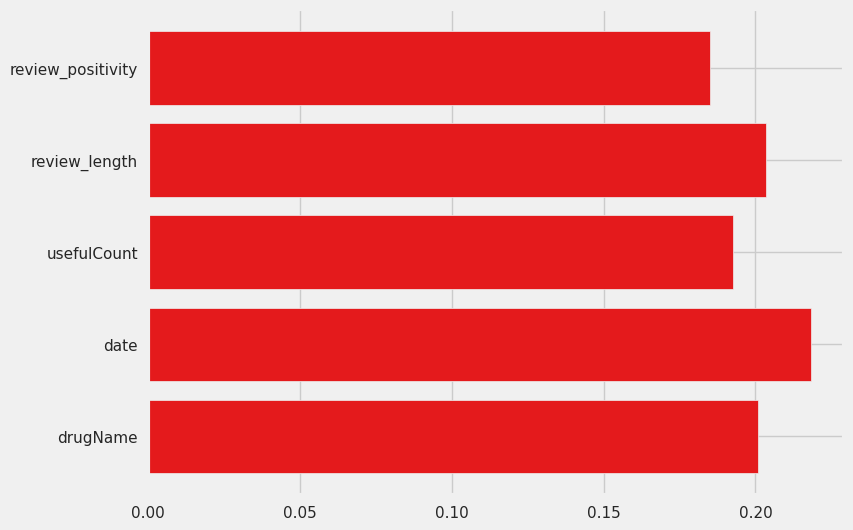

In [ ]:
# Feature Importance
from matplotlib import pyplot                            # Import pyplot (to be able generate the barchart later in this snippet)
plt.rcParams["figure.figsize"] = (8,6)
model = RandomForestClassifier()                         # Create an instance of a RandomForestClassifier
# fit the model
model.fit(X, y)                  # Fit the RandomForest instance using the traiing data
# get importance
importance = model.feature_importances_                  # The RandomForestClassifier instance computes feature importance as a bonus. Store them imprtance values in importance'.
# summarize feature importance
plt.barh(col_names, model.feature_importances_)

##*Training & Test Datasets*

In [ ]:
# Split data into training and test data
x1_train, x1_test,y1_train,y1_test = train_test_split(X,y, test_size=0.2, random_state=0)

In [ ]:
# Shape of x1_train
x1_train.shape

(7955, 5)

##*SMOTE*

In [ ]:
# SMOTE (Synthetic Minority Class Oversampling) of training data
smote = SMOTE(random_state=42)
x1_train, y1_train = smote.fit_resample(x1_train, y1_train)

In [ ]:
y.mean()

rating    0.489843
dtype: float64

In [ ]:
# Shape of x1_train
x1_train.shape

(8174, 5)

##*Recursive Feature Importance (RFE)*

In [ ]:
from sklearn.feature_selection import RFE
rfe = RFE(estimator=RandomForestClassifier(), n_features_to_select=5)
_ = rfe.fit(X,y)
print('Important Features\n',X.columns[rfe.support_])
rf = RandomForestClassifier()
_ = rf.fit(rfe.transform(X), y)
print("\n Accuracy: ",rf.score(rfe.transform(X), y))

Important Features
 Index(['drugName', 'date', 'usefulCount', 'review_length',
       'review_positivity'],
      dtype='object')

 Accuracy:  1.0


In [ ]:
# Standardization z-score  (https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.StandardScaler.html#sklearn.preprocessing.StandardScaler)
# from sklearn.preprocessing import StandardScaler
stdsc = StandardScaler()
x1_train = stdsc.fit_transform(x1_train)
x1_test = stdsc.transform(x1_test)

#**M4 Classifier Development**
The M4 Hackathon starts here!

#*Low Code: PyCaret*

,Description,Value
0,Session id,559
1,Target,rating
2,Target type,Binary
3,Original data shape,"(9944, 6)"
4,Transformed data shape,"(9944, 6)"
5,Transformed train set shape,"(6960, 6)"
6,Transformed test set shape,"(2984, 6)"
7,Numeric features,5
8,Preprocess,True
9,Imputation type,simple


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
gbc,Gradient Boosting Classifier,0.6487,0.6988,0.6178,0.6486,0.6324,0.2965,0.2971,1.2470
ada,Ada Boost Classifier,0.6454,0.6913,0.6105,0.6461,0.6276,0.2897,0.2903,0.4390
lightgbm,Light Gradient Boosting Machine,0.6428,0.6906,0.6295,0.6373,0.6332,0.2852,0.2854,0.3500
rf,Random Forest Classifier,0.6335,0.6821,0.6172,0.6284,0.6225,0.2664,0.2666,1.6040
qda,Quadratic Discriminant Analysis,0.6359,0.6799,0.6430,0.6249,0.6337,0.2720,0.2722,0.0930
lda,Linear Discriminant Analysis,0.6368,0.6790,0.6275,0.6296,0.6284,0.2732,0.2733,0.2510
lr,Logistic Regression,0.6356,0.6787,0.6225,0.6295,0.6258,0.2708,0.2709,0.6880
xgboost,Extreme Gradient Boosting,0.6359,0.6759,0.6210,0.6305,0.6256,0.2713,0.2715,0.8350
et,Extra Trees Classifier,0.6241,0.6726,0.6046,0.6194,0.6118,0.2476,0.2478,1.3160
nb,Naive Bayes,0.6305,0.6719,0.6195,0.6236,0.6215,0.2605,0.2606,0.1590


Processing:   0%|          | 0/65 [00:00<?, ?it/s]

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.6595,0.6935,0.6246,0.6615,0.6425,0.3179,0.3184
1,0.6092,0.6651,0.5425,0.6146,0.5763,0.2163,0.2177
2,0.6566,0.7059,0.6041,0.6645,0.6329,0.3117,0.3130
3,0.6451,0.7004,0.5894,0.6526,0.6194,0.2886,0.2899
4,0.6408,0.6772,0.6041,0.6417,0.6224,0.2805,0.2810
5,0.6063,0.6760,0.5161,0.6175,0.5623,0.2098,0.2126
6,0.6307,0.6607,0.5953,0.6304,0.6124,0.2604,0.2608
7,0.6121,0.6511,0.5982,0.6053,0.6018,0.2236,0.2237
8,0.6810,0.7460,0.6246,0.6938,0.6574,0.3606,0.3623


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

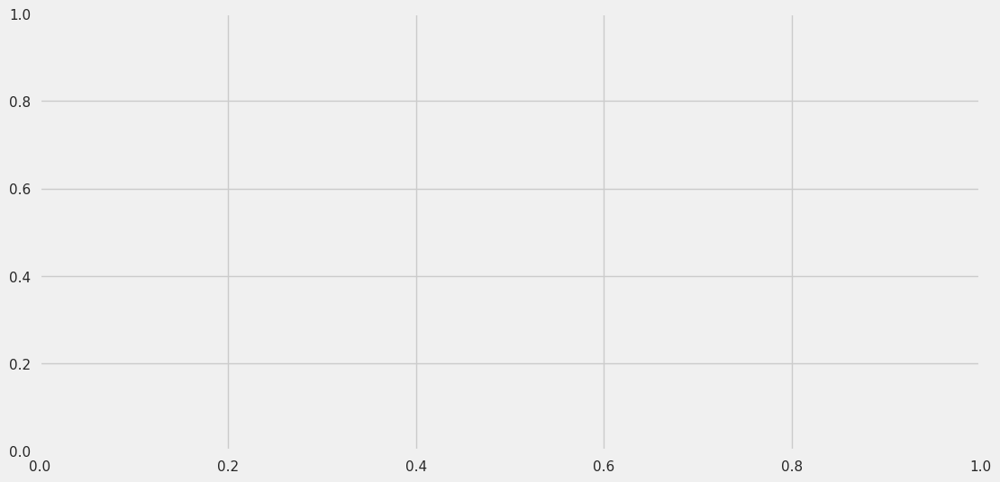

In [ ]:
#Low-Code PyCaret code
# Combine the predictor dataframe X and target dataframe y to get df1
df1 = pd.concat([X, y], axis=1)

# Initialize PyCaret
clf = setup(data=df1, target='rating')

# Compare multiple models and select the best one
best_model = compare_models(sort='AUC')

# Tune the model using a grid search
tuned_model = tune_model(best_model)

# Evaluate the performance of the tuned model
evaluate_model(tuned_model)

# Train the best model on the entire dataset
final_model = finalize_model(tuned_model)

# # Interpret final_model and plot the AUC curve
# plot_model(final_model, plot='auc')

In [ ]:
# Fit PyCaret classifier on training data
pycaret_clf = tuned_model.fit(x1_train, y1_train)

# Predict target values for test data
y1_hat = pycaret_clf.predict(x1_test)
y1_hat=pd.DataFrame(y1_hat)
cm = confusion_matrix(y1_test, y1_hat)
accuracy =  (cm[0,0] + cm[1,1])/( cm[0,0] + cm[0,1] + cm[1,0] + cm[1,1])
print("Confusion matrix\n",cm, "\n\nAccuracy = ",accuracy)

Confusion matrix
 [[654 332]
 [379 624]] 

Accuracy =  0.6425339366515838


In [ ]:
# Show tuned_model
tuned_model

GradientBoostingClassifier(ccp_alpha=0.0, criterion='friedman_mse', init=None,
                           learning_rate=0.1, loss='log_loss', max_depth=3,
                           max_features=None, max_leaf_nodes=None,
                           min_impurity_decrease=0.0, min_samples_leaf=1,
                           min_samples_split=2, min_weight_fraction_leaf=0.0,
                           n_estimators=100, n_iter_no_change=None,
                           random_state=559, subsample=1.0, tol=0.0001,
                           validation_fraction=0.1, verbose=0,
                           warm_start=False)

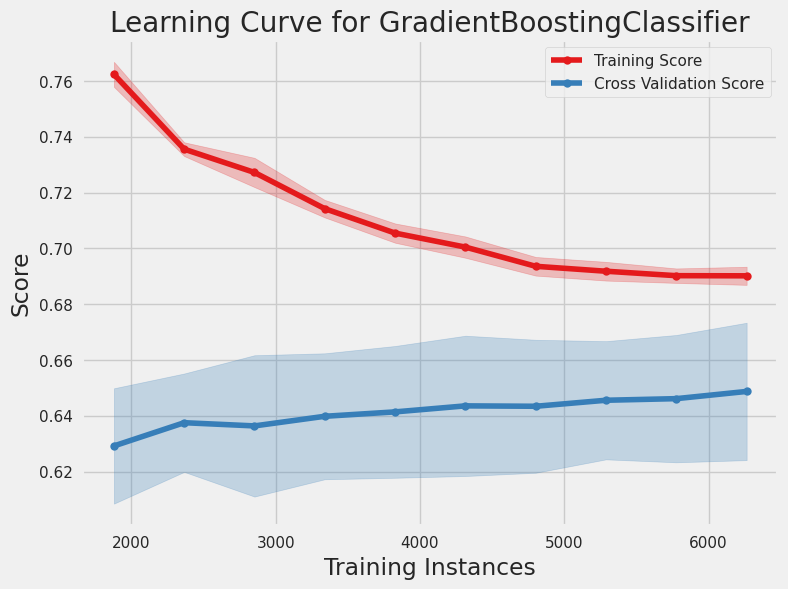

In [ ]:
plot_model(tuned_model, plot = 'learning', use_train_data = True)


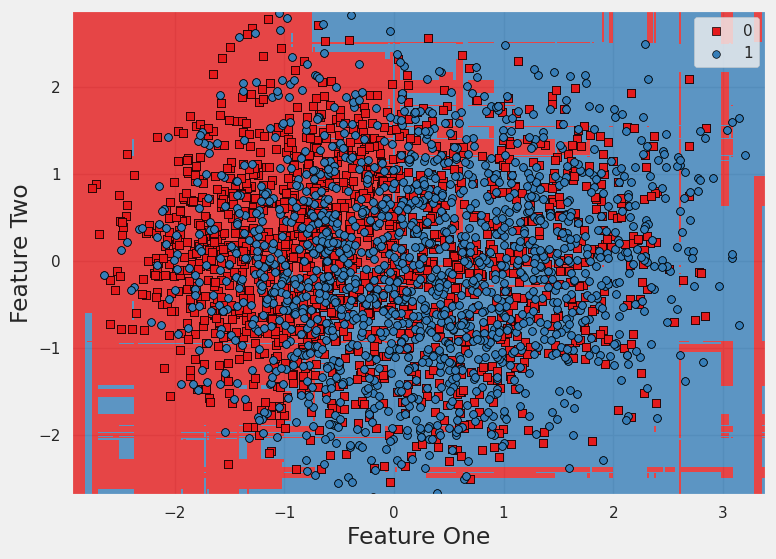

In [ ]:
# Decision boundary using low-code
plot_model(tuned_model, plot = 'boundary', use_train_data = True)


##*Horse Race Using Code Classifiers*

In [ ]:
# Workflow standardizes, SMOTEs training set, fits a classifier, and reports metrics.
# SMOTE evidently doesn't have a 'fit_transform' method, so there's no way to incorporate it into an sklearn pipeline
# We'll consider an alternative - an imblearn pipeline in the gridsearch section

names = ["Logistic Regression", "Decision Tree", "Random Forest", "XG Boost", "Light GBM"]
classifiers = [
    LogisticRegression(),
    DecisionTreeClassifier(),
    RandomForestClassifier(),
    XGBClassifier(),
    LGBMClassifier()]

# Build each classifier using the unbalanced TRAINING data, show decision region and petrformance of the unbalanced TEST data
no_folds = 5 # number of folds desired for cross validation
kf = StratifiedKFold(n_splits=no_folds, shuffle=True, random_state=12345)
for name, clf in zip(names, classifiers):
  print('CLASSIFIER: ',name,'\n')
  mean_accuracy = 0.0
  mean_balanced_accuracy = 0.0
  mean_auc = 0.0
  for fold, (train_index, test_index) in enumerate(kf.split(X,y),1):
    X_train, X_test = X.iloc[list(train_index)], X.iloc[list(test_index)]
    y_train, y_test = y.iloc[list(train_index)], y.iloc[list(test_index)]
    sm = SMOTE()
    X_train_SMOTE, y_train_SMOTE = sm.fit_resample(X_train, y_train)
    stdsc = StandardScaler()
    X_train_SMOTE_std = stdsc.fit_transform(X_train_SMOTE)
    X_test_std = stdsc.transform(X_test)
    clf.fit(X_train_SMOTE_std, y_train_SMOTE)
    y_pred = clf.predict(X_test_std)
    print(f'For fold {fold}:')
    print(f'Accuracy: {clf.score(X_test_std, y_test)}')
    print(f'Balanced Accuracy: {balanced_accuracy_score(y_test, y_pred)}')
    print(f'AUC: {roc_auc_score(y_test, y_pred)}')
    mean_accuracy = mean_accuracy + clf.score(X_test_std, y_test)
    mean_balanced_accuracy = mean_balanced_accuracy + balanced_accuracy_score(y_test, y_pred)
    mean_auc = mean_auc + roc_auc_score(y_test, y_pred)
  mean_accuracy = mean_accuracy / no_folds
  mean_balanced_accuracy = mean_balanced_accuracy / no_folds
  mean_auc = mean_auc / no_folds
  print('Average accuracy: %.3f Average balanced accuracy: %.3f Average AUC: %.3f\n\n' % (mean_accuracy, mean_balanced_accuracy, mean_auc))

CLASSIFIER:  Logistic Regression 

For fold 1:
Accuracy: 0.6143790849673203
Balanced Accuracy: 0.6143706820687632
AUC: 0.6143706820687632
For fold 2:
Accuracy: 0.6415284062342886
Balanced Accuracy: 0.64165596140035
AUC: 0.64165596140035
For fold 3:
Accuracy: 0.6299648064353947
Balanced Accuracy: 0.6303051759541174
AUC: 0.6303051759541173
For fold 4:
Accuracy: 0.6410256410256411
Balanced Accuracy: 0.6412031558185405
AUC: 0.6412031558185405
For fold 5:
Accuracy: 0.6292756539235412
Balanced Accuracy: 0.6294798893519475
AUC: 0.6294798893519475
Average accuracy: 0.631 Average balanced accuracy: 0.631 Average AUC: 0.631


CLASSIFIER:  Decision Tree 

For fold 1:
Accuracy: 0.5510306686777275
Balanced Accuracy: 0.5510990178128887
AUC: 0.5510990178128887
For fold 2:
Accuracy: 0.5656108597285068
Balanced Accuracy: 0.5653017873580077
AUC: 0.5653017873580077
For fold 3:
Accuracy: 0.579185520361991
Balanced Accuracy: 0.5793487826342036
AUC: 0.5793487826342035
For fold 4:
Accuracy: 0.577677224736048

##*Tune LightGBM Winner*

In [ ]:
# Create a pipeline with SMOTE and StandardScaler and then gridsearch the best classifier using five cross-validation folds
model = imbpipeline([
        ('sample', SMOTE()),
        ('std', StandardScaler()),
        ('clf', LGBMClassifier())])


param_grid = {
    'clf__num_leaves': [20,60,100],
    'clf__min_child_samples': [5,10,15],
    'clf__max_depth': [-1,8,20],
    'clf__learning_rate': [0.05,0.1,0.2],
    'clf__reg_alpha': [0,0.01,0.03] }

grid = GridSearchCV(estimator=model, param_grid=param_grid, cv = 5, scoring = 'roc_auc')
grid.fit(X, y)
print(grid.best_params_)
print(grid.best_estimator_)

{'clf__learning_rate': 0.05, 'clf__max_depth': 20, 'clf__min_child_samples': 15, 'clf__num_leaves': 20, 'clf__reg_alpha': 0}
Pipeline(memory=None,
         steps=[('sample',
                 SMOTE(k_neighbors=5, n_jobs=None, random_state=None,
                       sampling_strategy='auto')),
                ('std',
                 StandardScaler(copy=True, with_mean=True, with_std=True)),
                ('clf',
                 LGBMClassifier(boosting_type='gbdt', class_weight=None,
                                colsample_bytree=1.0, importance_type='split',
                                learning_rate=0.05, max_depth=20,
                                min_child_samples=15, min_child_weight=0.001,
                                min_split_gain=0.0, n_estimators=100, n_jobs=-1,
                                num_leaves=20, objective=None,
                                random_state=None, reg_alpha=0, reg_lambda=0.0,
                                silent='warn', subsample=1.0,

In [ ]:
winner = LGBMClassifier(boosting_type='gbdt', class_weight=None,
                                colsample_bytree=1.0, importance_type='split',
                                learning_rate=0.05, max_depth=20,
                                min_child_samples=15, min_child_weight=0.001,
                                min_split_gain=0.0, n_estimators=100, n_jobs=-1,
                                num_leaves=20, objective=None,
                                random_state=None, reg_alpha=0, reg_lambda=0.0,
                                silent='warn', subsample=1.0,
                                subsample_for_bin=200000, subsample_freq=0)

##*Report Confusion Matrix and Learning Curve for LightGBM Winner*

In [ ]:
# Learning Curve
from sklearn.model_selection import learning_curve

Test Mean:  [0.63616159 0.63666239 0.64008079 0.64239346 0.64631609]


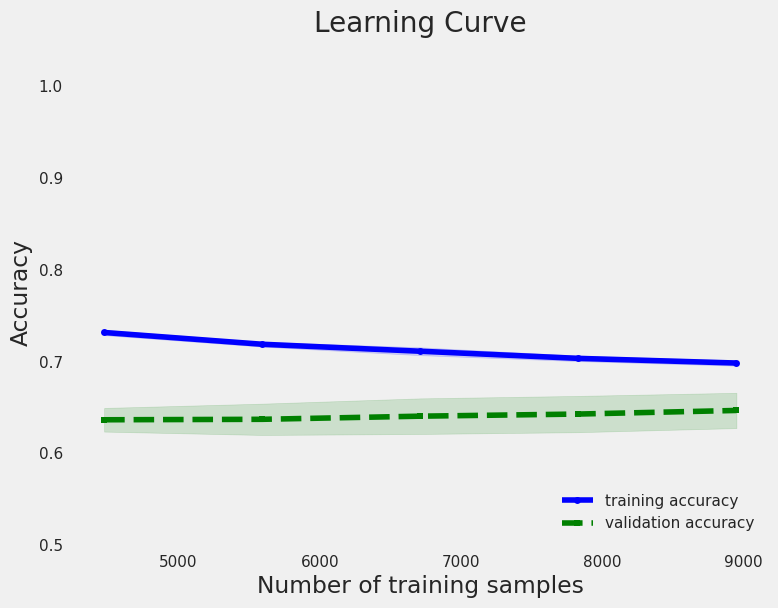

In [ ]:
model = imbpipeline([
        ('sample', SMOTE()),
        ('std', StandardScaler()),
        ('clf', winner)])

train_sizes, train_scores, test_scores = learning_curve(estimator=model,
                               X=X,
                               y=y,
                               train_sizes=np.linspace(0.5, 1.0, 5),
                               cv=10,
                               n_jobs=1)

train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)


print('Test Mean: ',test_mean)
plt.plot(train_sizes, train_mean,
         color='blue', marker='o',
         markersize=5, label='training accuracy')

plt.fill_between(train_sizes,
                 train_mean + train_std,
                 train_mean - train_std,
                 alpha=0.15, color='blue')

plt.plot(train_sizes, test_mean,
         color='green', linestyle='--',
         marker='s', markersize=5,
         label='validation accuracy')

plt.fill_between(train_sizes,
                 test_mean + test_std,
                 test_mean - test_std,
                 alpha=0.15, color='green')

plt.grid()
plt.xlabel('Number of training samples')
plt.ylabel('Accuracy')
plt.legend(loc='lower right')
plt.ylim([0.5, 1.05])
plt.tight_layout()
plt.title('Learning Curve')
# plt.savefig('./figures/learning_curve.png', dpi=300)
plt.show()

In [ ]:
# Predict target values for test data
winner.fit(x1_train,y1_train)
y1_hat = winner.predict(x1_test)
y1_hat=pd.DataFrame(y1_hat)
cm = confusion_matrix(y1_test, y1_hat)
accuracy =  (cm[0,0] + cm[1,1])/( cm[0,0] + cm[0,1] + cm[1,0] + cm[1,1])
print("Confusion matrix\n",cm, "\n\nAccuracy = ",accuracy)

Confusion matrix
 [[622 364]
 [357 646]] 

Accuracy =  0.637506284565108
